In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches
import seaborn as sns
import geopandas as gpd
import contextily as cx
from PIL import Image

In [2]:
import sys
sys.path.append("ProcessModelResults/")
from my_functions import *

In [3]:
catchment_name = 'LinDyke'

In [4]:
methods_dict = {'Idealised': ['6h_sp_fl_0.1', '6h_sp_fl_0.2', '6h_sp_fl_0.3', '6h_sp_fl_0.4','6h_sp_c_0.5',
          '6h_sp_bl_0.6','6h_sp_bl_0.7','6h_sp_bl_0.8','6h_sp_bl_0.9'],
                'Observed':['6h_feh_singlepeak', '6h_c1','6h_c2','6h_c3','6h_c4', '6h_c5', '6h_c6','6h_c7',
             '6h_c8','6h_c9','6h_c10', '6h_c11', '6h_c12','6h_c13','6h_c14','6h_c15'], 
               'SinglePeak_Scaled':['6h_sp_+0%','6h_sp_+5%','6h_sp_+10%','6h_sp_+15%','6h_sp_+20%']}

In [5]:
feh_profile = pd.read_csv("CreateSyntheticRainfallEvents/FEHProfiles/{}/6hr_100yrRP/PreLossRemoval/6hr_100yrRP_6.01h_1mintimestep.csv".format(catchment_name))

## Plot catchments

In [6]:
# Catchment boundaries
lindyke_gdf = gpd.read_file('../../FloodModelling/LinDykeModels/Model_IdealisedProfiles/CatchmentLinDyke_exported.shp')
wykebeck_gdf = gpd.read_file('../../FloodModelling/WykeBeckModels/Model_IdealisedProfiles/WykeBeckCatchment.shp')
# Watercourses (for whole country)
watercourses = gpd.read_file('../../FloodModelling/ExtraData/Watercourses/WatercourseLink.shp')
# Boundary of whole city, for centering map
leeds_gdf =  gpd.read_file('../../FloodModelling/ExtraData/LeedsBoundary/LeedsCatchments.shp')
# Profile lines
profileLines_LD = gpd.read_file('../../FloodModelling/LinDykeModels/Model_IdealisedProfiles/Features/Profile Lines.shp')
profileLines_WB = gpd.read_file('../../FloodModelling/WykeBeckModels/Model_IdealisedProfiles/Features/Profile Lines.shp')

fig, ax = plt.subplots(figsize=(24, 10))
#plt.rcParams['figure.dpi']=1200 
leeds_gdf.plot(ax=ax, facecolor="none", linewidth=0.01, edgecolor ='black')
for catchment_gdf in [wykebeck_gdf, lindyke_gdf]:
    catchment_gdf.plot(ax=ax, facecolor="none", linewidth=1, edgecolor ='black')
    # get watercourses just for this catchment
    watercourses_clip = gpd.clip(watercourses, catchment_gdf)
    watercourses_clip.plot(ax=ax, linewidth=1)
    # add basemap
    ax.axis('off');

profileLines_LD.plot(ax=ax, linewidth=3, color='red') 
profileLines_WB.plot(ax=ax, linewidth=3, color='red') 
cx.add_basemap(ax, crs = catchment_gdf.crs.to_string(), url = cx.providers.OpenTopoMap, zoom=12)    
# fig.savefig("FigsForPaper/Catchments.png",bbox_inches='tight', dpi=1200)
fig.savefig("FigsForPaper/Catchments_lowres.png",bbox_inches='tight')
plt.close()

In [7]:
# # Opens a image in RGB mode
# im = Image.open("FigsForPaper/Catchments.png")#.convert('L')
 
# #Image.crop(left, top, right, bottom)    
# left = 260
# top = 260
# right = 840
# bottom = 640
   
# im = im.crop((left, top, right, bottom)) 
# im.save("FigsForPaper/Catchments_test.png",bbox_inches='tight', dpi=1200)    

## Plot profiles (idealised and observed) - for Lin Dyke (but they will be v similar in both cases)

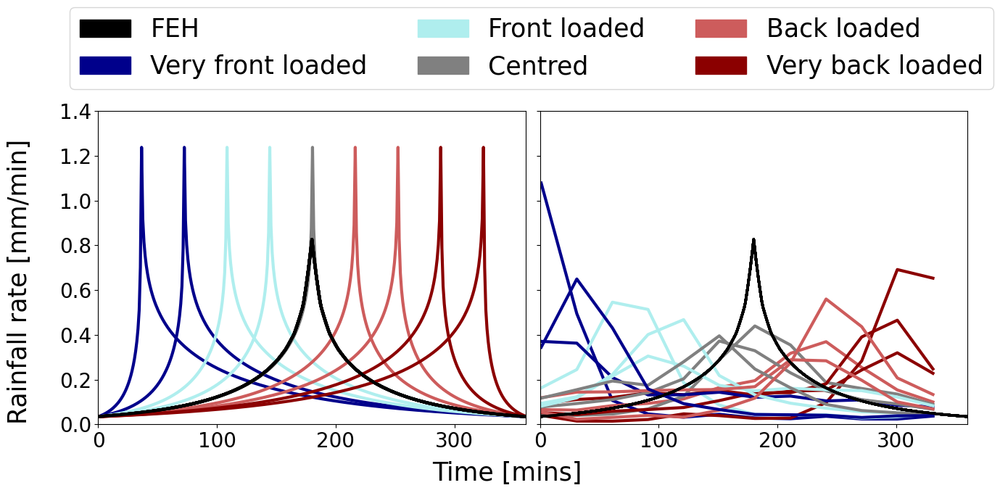

In [8]:
# Set up colours
colors_obs = ["darkblue","indianred","paleturquoise","darkred","darkred","grey","darkred","darkblue","grey","paleturquoise","paleturquoise","indianred","grey","indianred","darkblue"]
colors_idealised = ['darkblue']*2 + ['paleturquoise']*2 + ['grey']+ ['indianred']*2+['darkred']*2
colors_ls = {'Observed': colors_obs, 'Idealised': colors_idealised}

# set up figure instance
fig, axs = plt.subplots(ncols = 2, nrows = 1, figsize=(13,5), sharey=True)

for axes_number, method in enumerate(methods_dict['Idealised']):
    # Read in data
    idealised_profile = pd.read_csv("CreateSyntheticRainfallEvents/IdealisedProfiles/{}/6hr_100yrRP/PreLossRemoval/{}.csv".format(catchment_name, method), names = ['Time', 'Rainfall'])
    axs[0].plot(np.array(range(361))+0.5,idealised_profile['Rainfall'], color=colors_idealised[axes_number], linewidth = 3)   
    # Add FEh profile
    axs[0].plot(range(0,361), feh_profile['100 year design rainfall - FEH 2013 model'][:361], color = 'black', linewidth=3,
            linestyle = 'solid') 
    axs[0].tick_params(axis='both', which='major', labelsize=20)
    #axs[0].set_ylim(-0.05,1.35)  
    
for cluster_number in range(1,16):
    # Read in pre and post loss removal data
    observed_profile = pd.read_csv('CreateSyntheticRainfallEvents/ObservedProfiles/{}/6hr_100yrRP/PreLossRemoval/cluster{}.csv'.format(catchment_name, cluster_number), names = ['Time', 'Rainfall'])
    test = pd.DataFrame({'Rainfall':observed_profile['Rainfall'].unique(), 'Minute' : list(range(1,361,30))})
    axs[1].plot(test['Minute'],test['Rainfall'], color=colors_obs[cluster_number-1], linewidth = 3)   
    #axs[1].set_ylim(-0.05,1.35)    
    axs[1].tick_params(axis='both', which='major', labelsize=20)
    
    # loop through tickers and axes
    axs[1].plot(range(0,361), feh_profile['100 year design rainfall - FEH 2013 model'][:361], color = 'black', linewidth=2.5, linestyle = 'solid')

fig.text(0.5, -0.05, 'Time [mins]', ha='center', fontsize = 25)
fig.text(-0.03, 0.5, 'Rainfall rate [mm/min]', va='center', rotation='vertical', fontsize = 25)

fig.tight_layout() 

##############
# Create legend
##############
colors_leg = ['black', 'darkblue', 'paleturquoise','grey', 'indianred', 'darkred']
texts = ['FEH', 'Very front loaded','Front loaded','Centred', 'Back loaded', 'Very back loaded'] 
patches = [ mpatches.Patch(color=colors_leg[i], label="{:s}".format(texts[i]) ) for i in range(len(texts)) ]
#plt.legend(handles=patches, bbox_to_anchor=(1.24, 0.5), loc='center', ncol=1, prop={'size': 15});
# plt.legend(handles=patches, bbox_to_anchor=(0.78, 0.79), loc='center', ncol=1, prop={'size': 13.5});
plt.legend(handles=patches, bbox_to_anchor=(-0.02, 1.20), loc='center', ncol=3, prop={'size': 25});

custom_xlim = (0, 360)
custom_ylim = (-0, 1.4)

# Setting the values for all axes.
plt.setp(axs, xlim=custom_xlim, ylim=custom_ylim)

##############
# Save figure
##############
fig.savefig("CreateSyntheticRainfallEvents/Figs/Idealised_Observed_Profiles_{}.png".format(catchment_name),bbox_inches='tight')   

## Plot flooded extent

In [56]:
cluster_results_ip_ld= pd.read_csv("ProcessModelResults/Outputs/Data/IdealisedProfiles/LinDyke/allclusters_summary.csv",
                                  keep_default_na=False)
cluster_results_ip_wb= pd.read_csv("ProcessModelResults/Outputs/Data/IdealisedProfiles/WykeBeck/allclusters_summary.csv",
                                  keep_default_na=False)
cluster_results_op_ld= pd.read_csv("ProcessModelResults/Outputs/Data/ObservedProfiles/LinDyke/allclusters_summary.csv",
                                  keep_default_na=False)
cluster_results_op_wb= pd.read_csv("ProcessModelResults/Outputs/Data/ObservedProfiles/WykeBeck/allclusters_summary.csv",
                                  keep_default_na=False)

In [57]:
cluster_results_ip_ls = [cluster_results_ip_ld,cluster_results_ip_wb]
cluster_results_op_ls = [cluster_results_op_ld,cluster_results_op_wb]
catchment_name_ls = ['LinDyke','WykeBeck', 'LinDyke','WykeBeck']

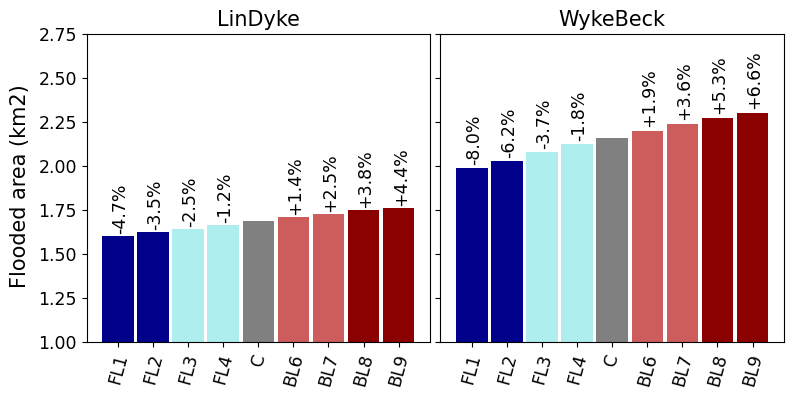

In [58]:
plot_flooded_extent_2catchments(cluster_results_ip_ls, '', 'Idealised','IP',2.75, 1.2, 1.02)

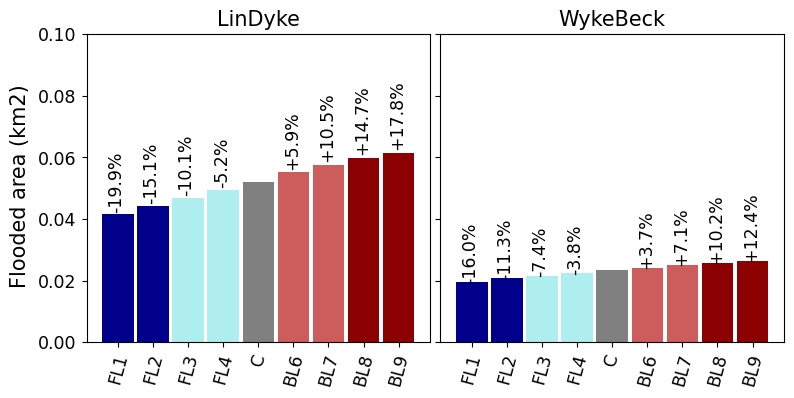

In [59]:
plot_flooded_extent_2catchments(cluster_results_ip_ls, 'Urban', 'Idealised','IP',0.1, 1.3, 1.04)

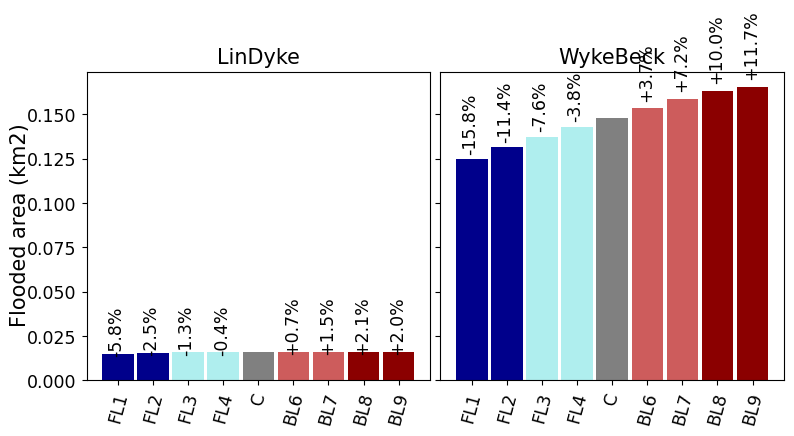

In [60]:
plot_flooded_extent_2catchments(cluster_results_ip_ls, 'Notwater', 'Idealised','IP',0.8, 1.3, 1.04)

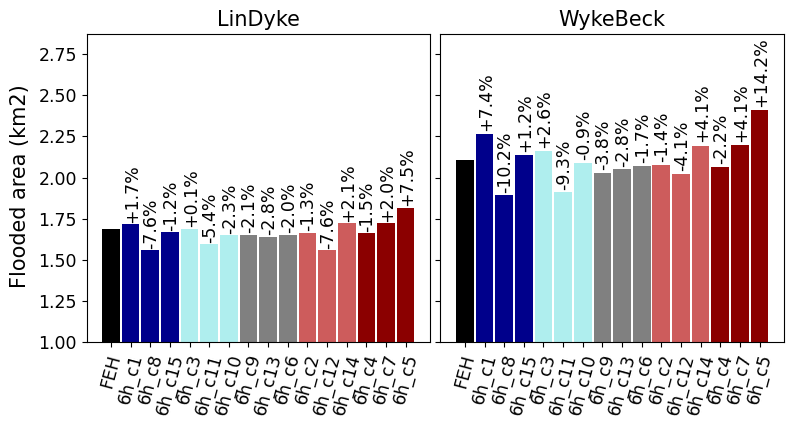

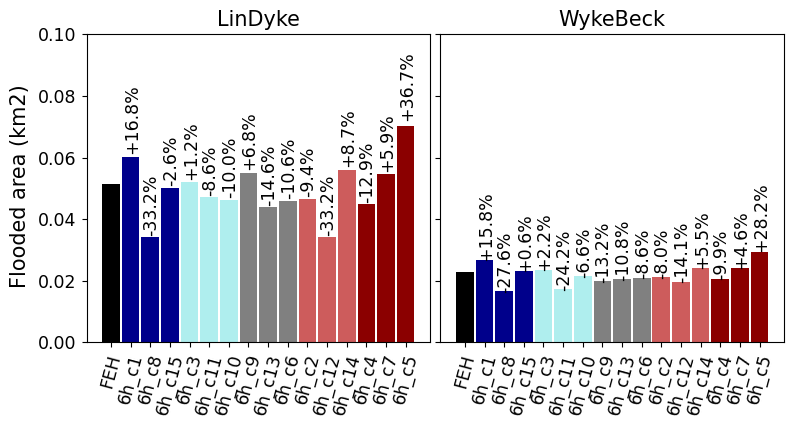

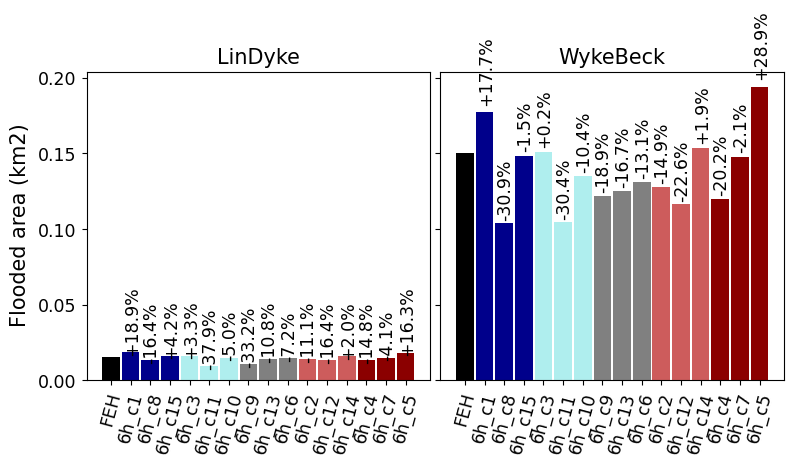

In [46]:
plot_flooded_extent_2catchments(cluster_results_op_ls, '', 'Observed','OP', 2.87, 1.4,1.02)
plot_flooded_extent_2catchments(cluster_results_op_ls, 'Urban', 'Observed','OP', 0.1, 1.4, 1.04 )
plot_flooded_extent_2catchments(cluster_results_op_ls, 'Notwater', 'Observed','OP', 0.1, 1.4, 1.04 )

## Plot Flood Severity

In [9]:
individual_cell_values_ip_ld= pd.read_csv("ProcessModelResults/Outputs/Data/IdealisedProfiles/LinDyke/individual_cell_values.csv")
individual_cell_values_ip_wb=pd.read_csv("ProcessModelResults/Outputs/Data/IdealisedProfiles/WykeBeck/individual_cell_values.csv")
individual_cell_values_op_ld= pd.read_csv("ProcessModelResults/Outputs/Data/ObservedProfiles/LinDyke/individual_cell_values.csv")
individual_cell_values_op_wb= pd.read_csv("ProcessModelResults/Outputs/Data/ObservedProfiles/WykeBeck/individual_cell_values.csv")
individual_cell_values_sps_ld= pd.read_csv("ProcessModelResults/Outputs/Data/SinglePeak_ScaledProfiles/LinDyke/individual_cell_values.csv")
individual_cell_values_sps_wb= pd.read_csv("ProcessModelResults/Outputs/Data/SinglePeak_ScaledProfiles/WykeBeck/individual_cell_values.csv")

In [12]:
individual_cell_values_ip = [individual_cell_values_ip_ld,individual_cell_values_ip_wb]
individual_cell_values_op = [individual_cell_values_op_ld,individual_cell_values_op_wb]
individual_cell_values_sps = [individual_cell_values_sps_ld,individual_cell_values_sps_wb]

### Plot boxplots

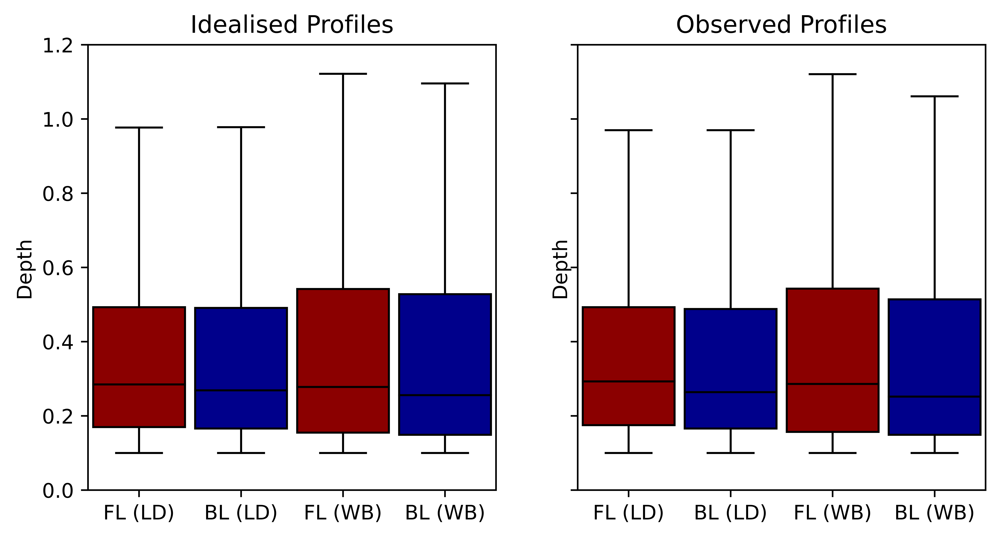

In [90]:
fig, axs = plt.subplots(1, 2,figsize=(8,4), sharey=True)    
boxplot(individual_cell_values_ip, "6h_sp_fl_0.1", "6h_sp_bl_0.9",  'Depth', axs[0], 'Idealised Profiles', False)
boxplot(individual_cell_values_op, "6h_c8", "6h_c5", 'Depth', axs[1], 'Observed Profiles', False)

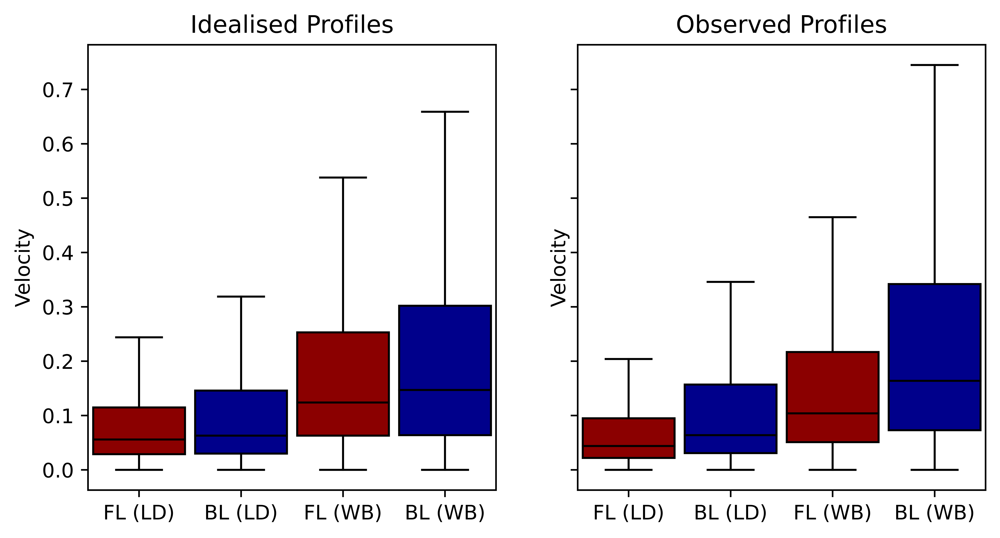

In [341]:
fig, axs = plt.subplots(1, 2,figsize=(8,4), sharey=True)    
boxplot(individual_cell_values_ip, "6h_sp_fl_0.1", "6h_sp_bl_0.9",  'Velocity', axs[0], 'Idealised Profiles', False)
boxplot(individual_cell_values_op, "6h_c8", "6h_c5", 'Velocity', axs[1], 'Observed Profiles', False)

### Plot histograms

In [92]:
bins = np.cumsum([0.1*1.19**i for i in np.arange (0.1,7,1)])
bins

array([0.10175475, 0.2228429 , 0.36693781, 0.53841074, 0.74246353,
       0.98528636, 1.27424552])

### Boxplot of distribution of depth values

/nfs/a321/gy17m2a/anaconda_install/anaconda3/envs/pygeospatial/lib/python3.9/site-packages/seaborn/distributions.py:407: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  and estimate_kws["bins"] == "auto"
/nfs/a321/gy17m2a/anaconda_install/anaconda3/envs/pygeospatial/lib/python3.9/site-packages/seaborn/distributions.py:407: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  and estimate_kws["bins"] == "auto"


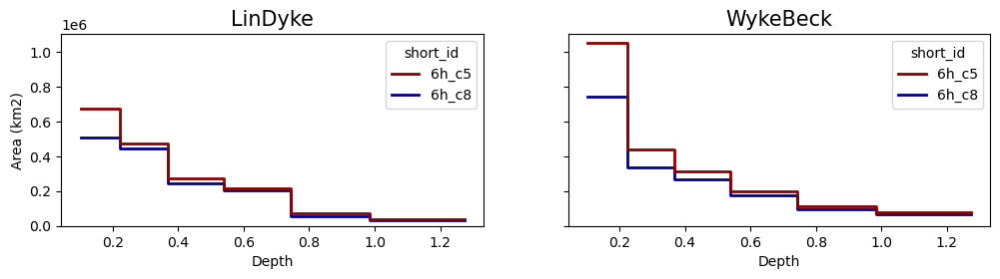

In [69]:
individual_cell_values_ls =individual_cell_values_op
variable_name = 'Depth'
profiles_name = 'Observed'
profiles_name_short = 'OP'
smallest_method = '6h_c8'
largest_method ='6h_c5' 
title= True

catchment_name_ls = ['LinDyke', 'WykeBeck']
# Define bins
bins = np.cumsum([0.1*1.15**i for i in range(10)])
bins = np.cumsum([0.1*1.14**i for i in np.arange (0.1,10.1,1)])
#bins = np.cumsum([0.1*1.05**i for i in np.arange (0.1,10,1)])
if variable_name == 'Depth':
    bins = np.cumsum([0.1*1.19**i for i in np.arange (0.1,7,1)])
elif variable_name =='Velocity':
    bins = np.cumsum([0.1*1.1**i for i in np.arange (0.1,6,1)])
    bins = np.insert(bins,0,0)
   # bins = np.cumsum([0.1*1.14**i for i in np.arange (0.1,10.1,1)])

# Make labels of bin values for dataframe
if variable_name == 'Depth':
    b = [f'{i}-{j}m' for i, j in zip(np.round(bins,1)[:], np.round(bins,1)[1:])] 
    b = b + ['>1.3m']
else:
    b = [f'{i}-{j}m/s' for i, j in zip(np.round(bins,1)[:], np.round(bins,1)[1:])] 
    b = b + ['>0.8m/s']

# Dataframe to store change percentages
df = pd.DataFrame({'Label':b})    

fig, axs = plt.subplots(ncols= 2, nrows=1, sharey=True,figsize = (12,2.5), gridspec_kw={'hspace':1, 'wspace': 0.2})

##############################
# Plot number of flooded cells
##############################
for number, ax in enumerate(axs.flatten()):
    individual_cell_values =  individual_cell_values_ls[number]
    if catchment_name_ls[number] =='WykeBeck':
        weight = 4
    elif catchment_name_ls[number] == 'LinDyke':
        weight = 1
    # Get the 2 most extreme scenario results separately
    extremes = individual_cell_values.loc[individual_cell_values['short_id'].isin([smallest_method, largest_method])].copy()
    # Get so the most/least extreme appear in plots with the colours in same order
    if profiles_name =='SinglePeak_Scaled':
        extremes.sort_values(by=['short_id'],ascending =True, inplace=True)
    else:
        extremes.sort_values(by=['short_id'],ascending=True, inplace=True)

    ls_values = sns.histplot(ax=axs[number], data=extremes, x=variable_name, hue='short_id',stat='count',element = 'step', 
                 linewidth=2, fill =False,log_scale=False,bins=bins, weights = weight, palette = ['darkred','darkblue']).get_lines()
    
    axs[number].set_ylabel('Area (km2)')
    
    if title == True:
        axs[number].set_title(catchment_name_ls[number],fontsize=15)

    #### Get change percentages
    change_pcs = []
    for num in range(0,len(ls_values[1].get_data()[1][:-1])):
        previous = ls_values[0].get_data()[1][:-1][num]
        current = ls_values[1].get_data()[1][:-1][num]
        change_percent = ((float(current)-previous)/previous)*100
        change_pcs.append(round(change_percent,1))   

    # Add ones not in the histogram    
    largest_method_values = individual_cell_values.loc[individual_cell_values['short_id'].isin([largest_method])].copy()
    smallest_method_values = individual_cell_values.loc[individual_cell_values['short_id'].isin([smallest_method])].copy()
    if variable_name == 'Depth':
        previous =len(smallest_method_values[smallest_method_values['Depth']>1.3])
        current = len(largest_method_values[largest_method_values['Depth']>1.3])
    else:
        previous =len(smallest_method_values[smallest_method_values['Velocity']>0.8])
        current = len(largest_method_values[largest_method_values['Velocity']>0.8])            

    change_pcs.append(round(((float(current)-previous)/previous)*100,1)) 
    # Add column in dataframe
    df['{} ({})'.format(profiles_name, catchments[number])]=change_pcs



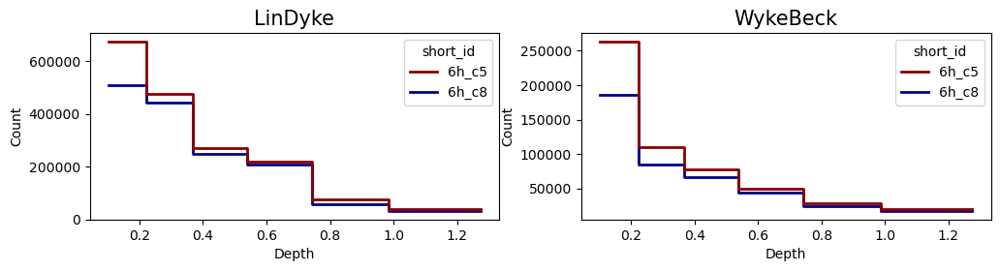

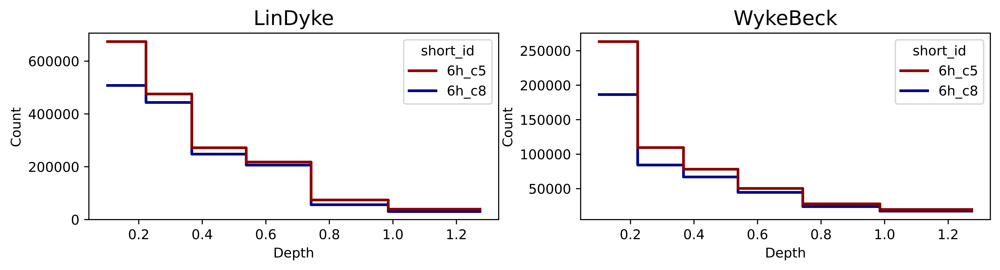

In [353]:
df_depth_observed = plot_histogram(individual_cell_values_op, 'Depth','Observed','OP','6h_c8', '6h_c5' , title= True)

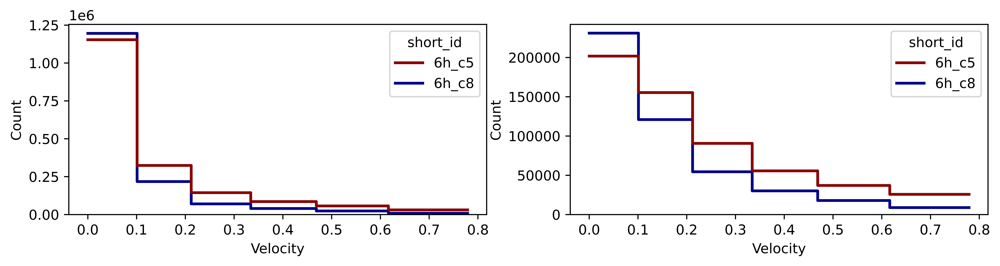

In [354]:
df_velocity_observed = plot_histogram(individual_cell_values_op, 'Velocity','Observed','OP','6h_c8', '6h_c5' , title= False)

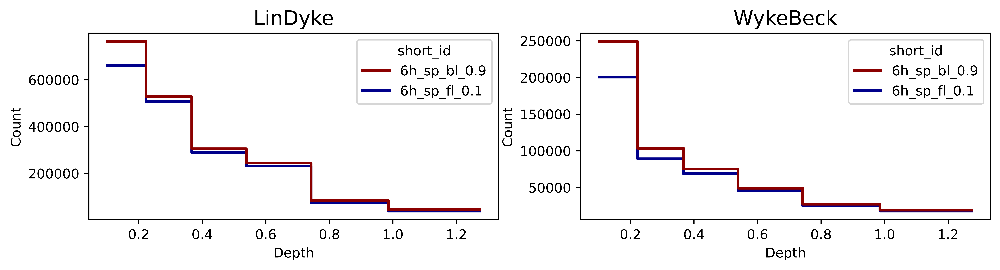

In [355]:
df_depth_idealised = plot_histogram(individual_cell_values_ip,  'Depth','Idealised', 'IP', '6h_sp_fl_0.1', '6h_sp_bl_0.9' , title= True)

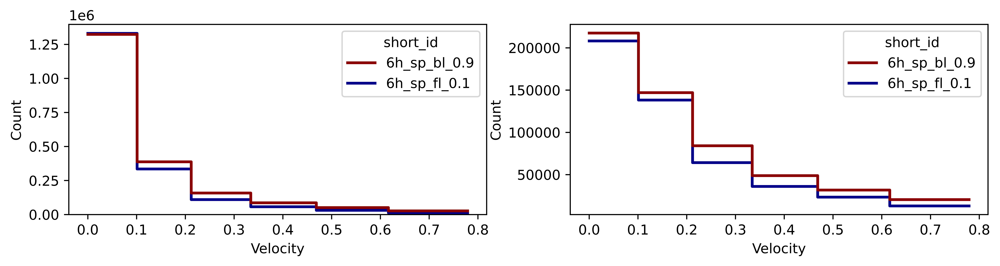

In [356]:
df_velocity_idealised = plot_histogram(individual_cell_values_ip,  'Velocity','Idealised', 'IP', '6h_sp_fl_0.1', '6h_sp_bl_0.9' , title= False)

In [337]:
# df_depth_idealised = plot_histogram(individual_cell_values_sps, 'SinglePeak_Scaled','SPS', '6h_sp_+0%', '6h_sp_+20%' )

### Make tablues summarising change percentages

In [357]:
pd.concat([df_velocity_idealised, df_velocity_observed.iloc[:,1:]], axis=1)

,Label,Idealised (LinDyke),Idealised (WykeBeck),Observed (LinDyke),Observed (WykeBeck)
0,0.0-0.1m,-0.6,4.5,-3.5,-12.7
1,0.1-0.2m,15.7,6.3,48.9,28.5
2,0.2-0.3m,44.1,31.1,104.4,66.2
3,0.3-0.5m,50.6,35.1,115.1,84.5
4,0.5-0.6m,62.9,35.6,139.9,107.0
5,0.6-0.8m,113.6,57.4,269.6,189.6
6,>0.8m/s,306.9,89.4,471.7,270.1


In [358]:
pd.concat([df_depth_idealised, df_depth_observed.iloc[:,1:]], axis=1)

,Label,Idealised (LinDyke),Idealised (WykeBeck),Observed (LinDyke),Observed (WykeBeck)
0,0.1-0.2m,15.6,24.2,32.7,41.2
1,0.2-0.4m,4.2,16.1,7.3,30.0
2,0.4-0.5m,5.3,9.3,9.8,16.7
3,0.5-0.7m,5.6,7.4,5.6,12.9
4,0.7-1.0m,15.3,10.1,32.3,16.6
5,1.0-1.3m,16.5,7.3,28.8,13.1
6,>1.3m,8.3,2.1,15.7,4.0


### Hazard

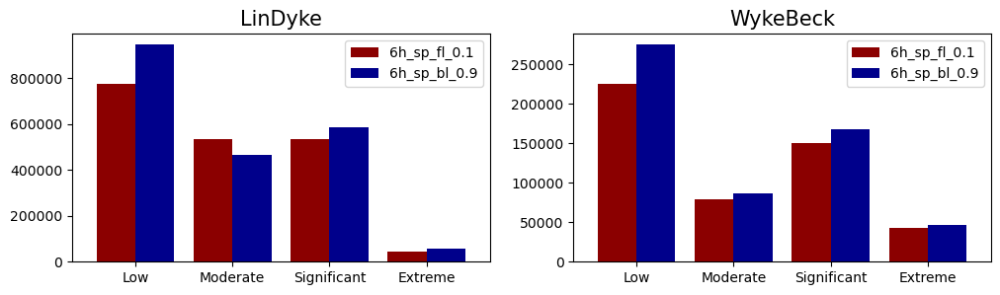

In [247]:
hazard_plot(individual_cell_values_ip, 'Idealised', 'IP', '6h_sp_fl_0.1', '6h_sp_bl_0.9' )

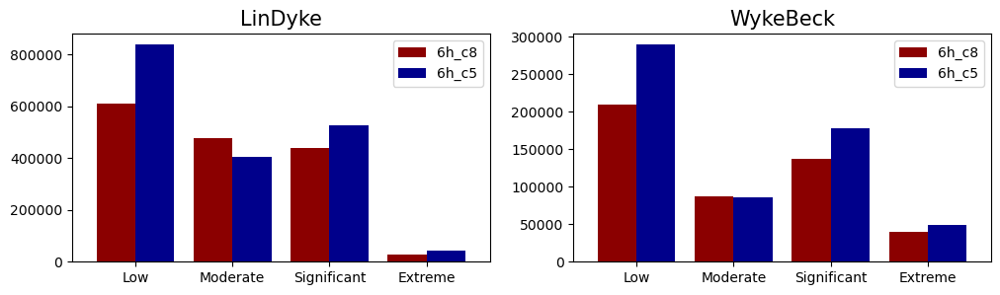

In [248]:
hazard_plot(individual_cell_values_op, 'Observed', 'OP','6h_c8', '6h_c5')

## Flow timeseries

In [213]:
profile_line_names_ld = ['KippaxBeck', 'SheffieldBeck', 'LinDyke']
profile_line_names_wb = ['WykeBeck','WykeBeck_YorkRoad','WykeBeck_PontefractLane','OtherStream_AheadOfConfluence',
                     'CatchmentBottom']
profile_line_names_wb_forplot = ['WykeBeck','WB (YorkRd)','WB (PontefractLane)','OtherStream',
                     'CatchmentBottom']

profile_line_names={'LinDyke':profile_line_names_ld, 'WykeBeck': profile_line_names_wb}

In [306]:
catchment_name = 'WykeBeck'
catchment_name_short = "WB"
sharey= False

if sharey == True:
    sharey_identifier = "_sharey"
else:
    sharey_identifier = ''

# Make the plot
fig, axs = plt.subplots(nrows=2,ncols=len(profile_line_names[catchment_name]), figsize = (14,6), sharex=True, sharey=sharey)

# Additional loop:
for methods_num, methods_key in enumerate(["Idealised", 'Observed']):
    # Get
    colors = colors_ls[methods_key]
    model_directory = '../../FloodModelling/{}Models/Model_{}Profiles/'.format(catchment_name, methods_key)
    
    # Create the column names used in the Hec-Ras flow timeseries output
    methods = methods_dict[methods_key]
    methods=methods[1:]
    column_names = ['Time (03/08/2022)']
    for method in methods:
        column_names.append(method + ' [Post Processed] (CMS)')
    
    # Loop through each of the profile line location and create a subplot with the flow timeseries lines for each rainfall profile
    for axs_numb, profile_line in enumerate(profile_line_names[catchment_name]):
        # Read in data and reorder columns
        flow_timeseries = pd.read_csv(model_directory + "FlowLines/{}.csv".format(profile_line))[column_names]
        # Trim off end
        flow_timeseries = flow_timeseries[:700]
        
        # Get FEH data
        feh_flow_timeseries = pd.read_csv('../../FloodModelling/{}Models/Model_FEHProfiles/FlowLines/{}.csv'.format(catchment_name, profile_line))
        feh_flow_timeseries = feh_flow_timeseries[:700]
        
        # Plot each line
        for number, column in enumerate(flow_timeseries.columns[1:]):
            axs[methods_num,axs_numb].plot(flow_timeseries[column], color = colors[number])
            axs[methods_num,axs_numb].plot(feh_flow_timeseries['6h_feh_singlepeak [Post Processed] (CMS)'], color = 'black',
                                          linestyle='dashed')
            
            # Add flow label to just the left hand plot
            if axs_numb ==0:
                axs[methods_num, axs_numb].set_ylabel('Flow (cumecs)')
            #  Add minute label if bottom row
            if methods_num ==1:
                axs[methods_num, axs_numb].set_xlabel('Minute')                    
            # Add the catchment names (using modified ones for WB)    
            if catchment_name == 'LinDyke':    
                axs[methods_num,axs_numb].text(0.03, 0.98, profile_line_names[catchment_name][axs_numb],
                                               horizontalalignment='left',verticalalignment='top',
                                                transform = axs[methods_num,axs_numb].transAxes)
                 # Add row title 
                if axs_numb ==1:
                    axs[methods_num,axs_numb].set_title(methods_key, fontsize=16)   
            else:
                axs[methods_num,axs_numb].text(0.03, 0.98, profile_line_names_wb_forplot[axs_numb],
                                               horizontalalignment='left',verticalalignment='top',
                                                transform = axs[methods_num,axs_numb].transAxes)
                 # Add row title 
                if axs_numb ==2:
                    axs[methods_num,axs_numb].set_title(methods_key, fontsize=16)                   
         
            
# Legend
colors = ['black','darkblue', 'paleturquoise', 'grey', 'indianred', 'darkred']
texts = ['FEH','F2','F1','C', 'B1', 'B2'] 
patches = [ mpatches.Patch(color=colors[i], label="{:s}".format(texts[i]) ) for i in range(len(texts)) ]
plt.legend(handles=patches, bbox_to_anchor=(1.25, 1), loc='center', ncol=1, prop={'size': 9} )

# fig.suptitle(catchment_name, fontsize=20)
figname = "ProcessModelResults/Outputs/Figs/BothProfiles/{}/{}_FlowTimeSeries{}.PNG".format(catchment_name, 
                                                                                          catchment_name_short, sharey_identifier)

plt.subplots_adjust(wspace=0.25)
fig.savefig(figname,bbox_inches='tight')

## Plot flooded area over time

In [10]:
sys.path.append("../")
from my_functions import *

if catchment_name == 'LinDyke':
    catchment_name_str = "Resampled.Terrain" 
    catchment_shpfilename = 'CatchmentLinDyke_exported'
    minx, miny, maxx, maxy  = 437000,  426500,  445500, 434300
    
elif catchment_name == 'WykeBeck':
    catchment_name_str = "Terrain.wykeDEM" 
    catchment_shpfilename = 'WykeBeckCatchment'
    minx, miny, maxx, maxy = 430004,  429978, 438660, 440996
    
# Create a bounding box (this is used in preparing the rasters)
bbox = box(minx, miny, maxx, maxy)

In [128]:
n_flooded_cells_dict_2mins = {}
for method in ['6h_sp_bl_0.6', '6h_sp_bl_0.9']:
    print(method)
    n_flooded_cells_2mins = []
    dates = []
    Hs=range(12,24)
    Ms= range(1,61,2)
    for H in Hs:
        for M in Ms:
            M = str(M).zfill(2)
            dates.append('{} {}'.format(H,M))
            fp = '../../FloodModelling/LinDykeModels/Model_IdealisedProfiles/{}/Depth (01AUG2022 {} {} 00).Resampled.Terrain.tif'.format(method, H, M)
            try:
                depth_timeslice = prepare_rainfall_scenario_raster(fp, bbox, remove_little_values)[0]
                n_flooded_cells_2mins.append(depth_timeslice.size - np.count_nonzero(np.isnan(depth_timeslice)))
            except:
                print(fp)
    # Add to dict
    n_flooded_cells_dict_2mins[method] = n_flooded_cells_2mins

6h_sp_bl_0.6
6h_sp_bl_0.9


In [136]:
# n_flooded_cells_dict_5mins = {}
for method in ['6h_sp_fl_0.1', '6h_sp_fl_0.2', '6h_sp_fl_0.3', '6h_sp_fl_0.4', '6h_sp_c_0.5', '6h_sp_bl_0.8']:
    print(method)
    n_flooded_cells_5mins = []
    Hs=range(12,24)
    Ms= range(0,60,5)
    for H in Hs:
        for M in Ms:
            if H == 12 and M == 0:
                pass
            else:
                M = str(M).zfill(2)
                dates.append('{} {}'.format(H,M))
                fp = '../../FloodModelling/LinDykeModels/Model_IdealisedProfiles/{}/Depth (01AUG2022 {} {} 00).Resampled.Terrain.tif'.format(method, H, M)
                try:
                    depth_timeslice = prepare_rainfall_scenario_raster(fp, bbox, remove_little_values)[0]
                    n_flooded_cells_5mins.append(depth_timeslice.size - np.count_nonzero(np.isnan(depth_timeslice)))                    
                except:
                    print(fp)
    # Add to dict
    n_flooded_cells_dict_5mins[method] = n_flooded_cells_5mins


6h_sp_bl_0.8


In [137]:
df_2mins =pd.DataFrame(n_flooded_cells_dict_2mins)
df_5mins =pd.DataFrame(n_flooded_cells_dict_5mins)

In [143]:
df_2mins['minute'] = list(range(1,len(df_2mins)*2,2))
df_5mins['minute'] = list(range(5,(len(df_5mins)*5)+5,5))

Text(0, 0.5, 'Flooded area (m2)')

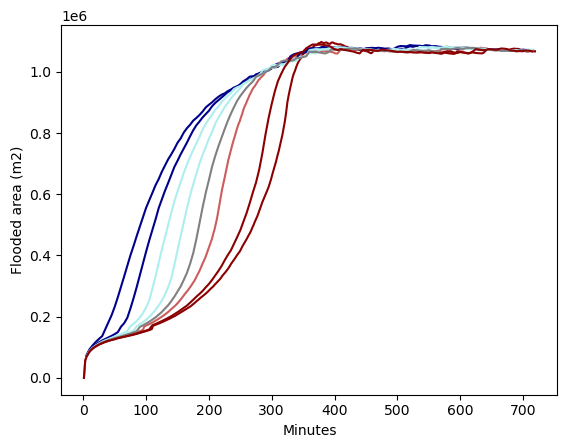

In [145]:
colors_2mins = ["indianred", 'darkred']
colors_5mins = ['darkblue', 'darkblue','paleturquoise','paleturquoise', 'grey', 'darkred']

fig, ax = plt.subplots()
for num, column in enumerate(df_2mins.columns[:-1]):
    ax.plot(df_2mins['minute'], df_2mins[column], color = colors_2mins[num])
for num, column in enumerate(df_5mins.columns[:-1]):
    ax.plot(df_5mins['minute'], df_5mins[column], color = colors_5mins[num])    
ax.set_xlabel('Minutes')
ax.set_ylabel('Flooded area (m2)')

In [1]:
import xarray as xr
from pathlib import Path

In [2]:
files = [i for i in Path("../../FloodModelling/LinDykeModels/Model_IdealisedProfiles/").iterdir() if i.suffix == ".hdf"]

In [166]:
for f in files:
    cond = len(list(xr.open_dataset(f).data_vars.values())) > 0
    if cond:
        print(f)


In [3]:
xr.open_dataset("../../FloodModelling/LinDykeModels/Model_IdealisedProfiles/DissModel.p06.hdf", engine="h5netcdf")

<xarray.Dataset>
Dimensions:  ()
Data variables:
    *empty*
Attributes:
    File Type:     HEC-RAS Results
    File Version:  HEC-RAS 6.3.1 September 2022
    Projection:    PROJCS["OSGB 1936 / British National Grid",GEOGCS["OSGB 19...
    Units System:  SI Units

In [172]:
pip install h5netcdf

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 34.6 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [19]:
import h5py
filename = "../../FloodModelling/LinDykeModels/Model_IdealisedProfiles/DissModel.p06.hdf"

with h5py.File(filename, "r") as f:
    arr = f['Results']['Unsteady']['Output']['Output Blocks']['Base Output']['Summary Output']['2D Flow Areas']['Catchment']['Maximum Water Surface'][()]

In [21]:
arr.shape

(2, 272042)

In [4]:
['Summary', 'Unsteady']
    # Print all root level object names (aka keys) 
    # these can be group or dataset names 
    print("Keys: %s" % f.keys())
    # get first object name/key; may or may NOT be a group
    a_group_key = list(f.keys())[0]

    # get the object type for a_group_key: usually group or dataset
    print(type(f[a_group_key])) 

    # If a_group_key is a group name, 
    # this gets the object names in the group and returns as a list
    data = list(f[a_group_key])

    # If a_group_key is a dataset name, 
    # this gets the dataset values and returns as a list
    data = list(f[a_group_key])
    # preferred methods to get dataset values:
    ds_obj = f[a_group_key]      # returns as a h5py dataset object
    ds_arr = f[a_group_key][()]  # returns as a numpy array

Keys: <KeysViewHDF5 ['Event Conditions', 'Geometry', 'Plan Data', 'Results']>
<class 'h5py._hl.group.Group'>


TypeError: Accessing a group is done with bytes or str, not <class 'tuple'>